<a href="https://colab.research.google.com/github/safaeArabat/ML/blob/master/breastCancer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install GEOparse

     |████████████████████████████████| 276kB 3.3MB/s 
  Created wheel for GEOparse: filename=GEOparse-2.0.1-cp36-none-any.whl size=28695 sha256=2f4c16569f2d300df3325a2c368399d8569ef96f432ba5b8813baa750453400a
  Stored in directory: /root/.cache/pip/wheels/bb/52/4c/44df5b0f3b97bf8172881065941a6b6e1c46408290b02daf7f
Successfully built GEOparse


In [ ]:
import GEOparse
import pandas as pd
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
%matplotlib inline
import sys
import sklearn
import os
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.metrics import confusion_matrix
import keras
from keras.models import Sequential
from keras.layers import Dense
from sklearn.metrics import confusion_matrix
import seaborn as sns

In [ ]:
#chargement des datas depuis GEo
gse = GEOparse.get_GEO(geo="GSE2034")

In [4]:
#Affichage du data
pd.options.display.max_columns = None
pd.options.display.max_rows = None
gse.gsm = gse.phenotype_data
print(gse.gsm.head(10))

                      title geo_accession                 status  \
GSM36777    Wang4812_JA_277      GSM36777  Public on Feb 23 2005   
GSM36778    Wang4813_JA_278      GSM36778  Public on Feb 23 2005   
GSM36779   Wang4630_JA798@C      GSM36779  Public on Feb 23 2005   
GSM36780  Wang4889_JA_846@2      GSM36780  Public on Feb 23 2005   
GSM36781  Wang4857_JA_765@2      GSM36781  Public on Feb 23 2005   
GSM36782     Wang4585_JA600      GSM36782  Public on Feb 23 2005   
GSM36783     Wang4586_JA601      GSM36783  Public on Feb 23 2005   
GSM36784     Wang4587_JA602      GSM36784  Public on Feb 23 2005   
GSM36785    Wang4820_JA_605      GSM36785  Public on Feb 23 2005   
GSM36786    Wang4821_JA_606      GSM36786  Public on Feb 23 2005   

         submission_date last_update_date type channel_count source_name_ch1  \
GSM36777     Dec 03 2004      May 31 2013  RNA             1          Breast   
GSM36778     Dec 03 2004      May 31 2013  RNA             1          Breast   
GSM36779   

In [5]:
#Lister les attributs
gse.gsm.columns

Index(['title', 'geo_accession', 'status', 'submission_date',
       'last_update_date', 'type', 'channel_count', 'source_name_ch1',
       'organism_ch1', 'taxid_ch1',
       'characteristics_ch1.0.bone relapses (1=yes, 0=no)', 'molecule_ch1',
       'description', 'platform_id', 'contact_name', 'contact_email',
       'contact_phone', 'contact_institute', 'contact_address', 'contact_city',
       'contact_state', 'contact_zip/postal_code', 'contact_country',
       'supplementary_file', 'relation', 'series_id', 'data_row_count'],
      dtype='object')

In [6]:
gene_classF = "https://raw.githubusercontent.com/safaeArabat/ML/master/dataSet/class.txt"
gene_class = pd.read_csv(gene_classF, sep=" ",header=None, error_bad_lines=False)
column = ['codePatient','situationPatient']
gene_class.columns=column
gene_class.head(10)

,codePatient,situationPatient
0,GSM36777,0
1,GSM36778,0
2,GSM36779,0
3,GSM36780,0
4,GSM36781,0
5,GSM36782,0
6,GSM36783,0
7,GSM36784,1
8,GSM36785,0
9,GSM36786,0


In [ ]:
#Les classes des patient qu'on va analyser
metadata = {}
for gsm_name, gsm in gse.gsms.items():
  for key, value in gsm.metadata.items():
    if key=='characteristics_ch1':
      #print(value)
      tmpVal = 0
      for tmp in value:
        splitUp = [i.strip() for i in tmp.split(':')]
        #print(splitUp[1])
        ex = ''.join(splitUp[1])
        ex2 = gsm_name
        print(ex2, ex)
        li = list(ex.split(" "))
        li2 = list(ex2.split(" ")) 

In [7]:
#La frequence des expressions de gene pour chaque patient
expression_genes = gse.pivot_samples('VALUE')
expression_genes.head(5)

name,GSM36777,GSM36778,GSM36779,GSM36780,GSM36781,GSM36782,GSM36783,GSM36784,GSM36785,GSM36786,GSM36787,GSM36788,GSM36789,GSM36790,GSM36791,GSM36792,GSM36793,GSM36794,GSM36795,GSM36796,GSM36797,GSM36798,GSM36799,GSM36800,GSM36801,GSM36802,GSM36803,GSM36804,GSM36805,GSM36806,GSM36807,GSM36808,GSM36809,GSM36810,GSM36811,GSM36812,GSM36813,GSM36814,GSM36815,GSM36816,GSM36817,GSM36818,GSM36819,GSM36820,GSM36821,GSM36822,GSM36823,GSM36824,GSM36825,GSM36826,GSM36827,GSM36828,GSM36829,GSM36830,GSM36831,GSM36832,GSM36833,GSM36834,GSM36835,GSM36836,GSM36837,GSM36838,GSM36839,GSM36840,GSM36841,GSM36842,GSM36843,GSM36844,GSM36845,GSM36846,GSM36847,GSM36848,GSM36849,GSM36850,GSM36851,GSM36852,GSM36853,GSM36854,GSM36855,GSM36856,GSM36857,GSM36858,GSM36859,GSM36860,GSM36861,GSM36862,GSM36863,GSM36864,GSM36865,GSM36866,GSM36867,GSM36868,GSM36869,GSM36870,GSM36871,GSM36872,GSM36873,GSM36874,GSM36875,GSM36876,GSM36877,GSM36878,GSM36879,GSM36880,GSM36881,GSM36882,GSM36883,GSM36884,GSM36885,GSM36886,GSM36887,GSM36888,GSM36889,GSM36890,GSM36891,GSM36892,GSM36893,GSM36894,GSM36895,GSM36896,GSM36897,GSM36898,GSM36899,GSM36900,GSM36901,GSM36902,GSM36903,GSM36904,GSM36905,GSM36906,GSM36907,GSM36908,GSM36909,GSM36910,GSM36911,GSM36912,GSM36913,GSM36914,GSM36915,GSM36916,GSM36917,GSM36918,GSM36919,GSM36920,GSM36921,GSM36922,GSM36923,GSM36924,GSM36925,GSM36926,GSM36927,GSM36928,GSM36929,GSM36930,GSM36931,GSM36932,GSM36933,GSM36934,GSM36935,GSM36936,GSM36937,GSM36938,GSM36939,GSM36940,GSM36941,GSM36942,GSM36943,GSM36944,GSM36945,GSM36946,GSM36947,GSM36948,GSM36949,GSM36950,GSM36951,GSM36952,GSM36953,GSM36954,GSM36955,GSM36956,GSM36957,GSM36958,GSM36959,GSM36960,GSM36961,GSM36962,GSM36963,GSM36964,GSM36965,GSM36966,GSM36967,GSM36968,GSM36969,GSM36970,GSM36971,GSM36972,GSM36973,GSM36974,GSM36975,GSM36976,GSM36977,GSM36978,GSM36979,GSM36980,GSM36981,GSM36982,GSM36983,GSM36984,GSM36985,GSM36986,GSM36987,GSM36988,GSM36989,GSM36990,GSM36991,GSM36992,GSM36993,GSM36994,GSM36995,GSM36996,GSM36997,GSM36998,GSM36999,GSM37000,GSM37001,GSM37002,GSM37003,GSM37004,GSM37005,GSM37006,GSM37007,GSM37008,GSM37009,GSM37010,GSM37011,GSM37012,GSM37013,GSM37014,GSM37015,GSM37016,GSM37017,GSM37018,GSM37019,GSM37020,GSM37021,GSM37022,GSM37023,GSM37024,GSM37025,GSM37026,GSM37027,GSM37028,GSM37029,GSM37030,GSM37031,GSM37032,GSM37033,GSM37034,GSM37035,GSM37036,GSM37037,GSM37038,GSM37039,GSM37040,GSM37041,GSM37042,GSM37043,GSM37044,GSM37045,GSM37046,GSM37047,GSM37048,GSM37049,GSM37050,GSM37051,GSM37052,GSM37053,GSM37054,GSM37055,GSM37056,GSM37057,GSM37058,GSM37059,GSM37060,GSM37061,GSM37062
ID_REF,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1007_s_at,3848.1,6520.9,5285.7,4043.7,4263.6,2949.8,5498.9,3863.1,3370.4,3991.9,4350.1,3080.6,4099.0,2397.0,3571.7,4464.5,3998.2,1064.9,4655.3,3562.3,3510.9,2974.8,3374.2,5559.6,4866.6,4018.8,4156.5,3165.2,6079.6,4182.8,3086.9,3737.0,2670.2,3730.9,2856.9,2248.5,2870.5,2881.8,2478.0,2175.4,2850.5,2598.6,3192.5,3426.4,3009.4,2960.3,2921.3,3521.8,3025.7,4032.8,3500.4,2546.9,4504.7,3116.9,2425.6,4001.2,2592.8,4902.3,3316.9,3055.5,5727.4,3819.4,5548.5,3019.0,2477.6,6404.6,3906.8,3364.1,5029.9,2033.2,6945.2,2694.4,4942.0,2683.7,2060.1,3058.2,3774.4,1584.8,5458.0,5318.7,3787.6,4042.5,4275.1,2891.2,6391.8,5679.4,2523.3,4558.4,3838.9,5415.0,5352.8,2368.2,3005.5,5033.0,2783.6,2606.4,4336.0,3592.2,3918.9,2722.2,4771.3,4846.8,3245.5,2651.4,2645.1,3341.6,3510.9,4166.6,4002.7,1868.4,3883.4,2885.5,1841.7,3100.7,5072.5,2147.5,4142.1,2127.6,5706.4,5723.7,3682.4,3137.0,8881.8,2057.0,3287.4,2652.8,2015.3,4522.9,596.5,2663.2,4570.4,4772.7,2987.2,2022.7,4334.0,4706.0,3297.4,3473.1,4136.5,1698.2,3392.8,3553.6,2891.7,4210.7,4264.0,4342.5,2374.4,4046.1,4628.9,4999.6,4014.7,3554.9,3766.4,7289.7,4525.0,3180.6,3865.2,2963.4,3633.0,3220.3

In [8]:
expression_geneT = expression_genes.transpose()

In [9]:
gene_classU = gene_class.drop('codePatient', axis=1)

In [10]:
expression_geneT.reset_index(drop=True, inplace=True)
gene_classU.reset_index(drop=True, inplace=True)
dataFinal = pd.concat([expression_geneT, gene_classU], axis = 1)
dataFinal.head(10)

,1007_s_at,1053_at,117_at,121_at,1255_g_at,1294_at,1316_at,1320_at,1405_i_at,1431_at,1438_at,1487_at,1494_f_at,1598_g_at,160020_at,1729_at,1773_at,177_at,179_at,1861_at,200000_s_at,200001_at,200002_at,200003_s_at,200004_at,200005_at,200006_at,200007_at,200008_s_at,200009_at,200010_at,200011_s_at,200012_x_at,200013_at,200014_s_at,200015_s_at,200016_x_at,200017_at,200018_at,200019_s_at,200020_at,200021_at,200022_at,200023_s_at,200024_at,200025_s_at,200026_at,200027_at,200028_s_at,200029_at,200030_s_at,200031_s_at,200032_s_at,200033_at,200034_s_at,200035_at,200036_s_at,200037_s_at,200038_s_at,200039_s_at,200040_at,200041_s_at,200042_at,200043_at,200044_at,200045_at,200046_at,200047_s_at,200048_s_at,200049_at,200050_at,200051_at,200052_s_at,200053_at,200054_at,200055_at,200056_s_at,200057_s_at,200058_s_at,200059_s_at,200060_s_at,200061_s_at,200062_s_at,200063_s_at,200064_at,200065_s_at,200066_at,200067_x_at,200068_s_at,200069_at,200070_at,200071_at,200072_s_at,200073_s_at,200074_s_at,200075_s_at,200076_s_at,200077_s_at,200078_s_at,200079_s_at,200080_s_at,200081_s_at,200082_s_at,200083_at,200084_at,200085_s_at,200086_s_at,200087_s_at,200088_x_at,200089_s_at,200090_at,200091_s_at,200092_s_at,200093_s_at,200094_s_at,200095_x_at,200096_s_at,200097_s_at,200098_s_at,200099_s_at,200593_s_at,200594_x_at,200595_s_at,200596_s_at,200597_at,200598_s_at,200599_s_at,200600_at,200601_at,200602_at,200603_at,200604_s_at,200605_s_at,200606_at,200607_s_at,200608_s_at,200609_s_at,200610_s_at,200611_s_at,200612_s_at,200613_at,200614_at,200615_s_at,200616_s_at,200617_at,200618_at,200619_at,200620_at,200621_at,200622_x_at,200623_s_at,200624_s_at,200625_s_at,200626_s_at,200627_at,200628_s_at,200629_at,200630_x_at,200631_s_at,200632_s_at,200633_at,200634_at,200635_s_at,200636_s_at,200637_s_at,200638_s_at,200639_s_at,200640_at,200641_s_at,200642_at,200643_at,200644_at,200645_at,200646_s_at,200647_x_at,200648_s_at,200649_at,200650_s_at,200651_at,200652_at,200653_s_at,200654_at,200655_s_at,200656_s_at,200657_at,200658_s_at,200659_s_at,200660_at,200661_at,200662_s_at,200663_at,200664_s_at,200665_s_at,200666_s_at,200667_at,200668_s_at,200669_s_at,200670_at,200671_s_at,200672_x_at,200673_at,200674_s_at,200675_at,200676_s_at,200677_at,200678_x_at,200679_x_at,200680_x_at,200681_at,200682_s_at,200683_s_at,200684_s_at,200685_at,200686_s_at,200687_s_at,200688_at,200689_x_at,200690_at,200691_s_at,200692_s_at,200693_at,200694_s_at,200695_at,200696_s_at,200697_at,200698_at,200699_at,200700_s_at,200701_at,200702_s_at,200703_at,200704_at,200705_s_at,200706_s_at,200707_at,200708_at,200709_at,200710_at,200711_s_at,200712_s_at,200713_s_at,200714_x_at,200715_x_at,200716_x_at,200717_x_at,200718_s_at,200719_at,200720_s_at,200721_s_at,200722_s_at,200723_s_at,200724_at,200725_x_at,200726_at,200727_s_at,200728_at,200729_s_at,200730_s_at,200731_s_at,200732_s_at,200733_s_at,200734_s_at,200735_x_at,200736_s_at,200737_at,200738_s_at,200739_s_at,200740_s_at,200741_s_at,200742_s_at,200743_s_at,200744_s_at,200745_s_at,200746_s_at,200747_s_at,200748_s_at,200749_at,200750_s_at,200751_s_at,200752_s_at,200753_x_at,200754_x_at,200755_s_at,200756_x_at,200757_s_at,200758_s_at,200759_x_at,200760_s_at,200761_s_at,200762_at,200763_s_at,200764_s_at,200765_x_at,200766_at,200767_s_at,200768_s_at,200769_s_at,200770_s_at,200771_at,200772_x_at,200773_x_at,200774_at,200775_s_at,200776_s_at,200777_s_at,200778_s_at,200779_at,200780_x_at,200781_s_at,200782_at,200783_s_at,200784_s_at,200785_s_at,200786_at,200787_s_at,200788_s_at,200789_at,200790_at,200791_s_at,200792_at,200793_s_at,200794_x_at,200795_at,200796_s_at,200797_s_at,200798_x_at,200799_at,200800_s_at,200801_x_at,200802_at,200803_s_at,200804_at,200805_at,200806_s_at,200807_s_at,200808_s_at,200809_x_at,200810_s_at,200811_at,200812_at,200813_s_at,200814_at,200815_s_at,200816_s_at,200817_x_at,200818_at,200819_s_at,200820_at,200821_at,200822_x_at,200823_x_at,200824_at,200825_s_at,200826_at,200827_at,200828_s_at,200829_x_at,200830_at,200831_s_at,200832_

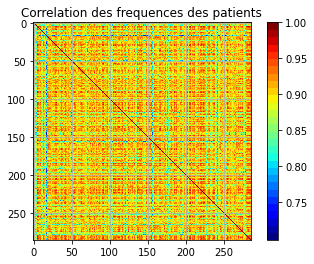

In [ ]:
from matplotlib import cm as cm

fig = plt.figure()
ax1 = fig.add_subplot(111)
cmap = cm.get_cmap('jet', 30)
cax = ax1.imshow(expression_genes.corr(), interpolation="none", cmap=cmap)
ax1.grid(True)
plt.title('Correlation des frequences des patients')
fig.colorbar(cax, ticks=[.75,.8,.85,.90,.95,1])
plt.show()

## 1 - Classification des genes à l'aide du modèle **Support Vector Machine (SVM)**
Un Support Vector Machine (SVM) est un classificateur discriminatoire formellement défini par un hyperplan de séparation. En d’autres termes, à partir de données d’entraînement étiquetées (apprentissage supervisé), l’algorithme produit un hyperplan optimal qui catégorise les nouveaux exemples.

**Division des données**

In [ ]:
#Diviser l'ensemble de données en un ensemble de test et un ensemble d'entrainement(30% de la taille pour le test et 70% pour l'entrainement) 
#La fonction train_test_split() prend 3 paramètres features, target, test_set size et random_state pour des enregistrements de manière aléatoire
Y = dataFinal['situationPatient'].values
X = dataFinal.drop('situationPatient', axis=1).values

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=12345)

**Le modèle générateur SVM**

In [ ]:
#Création du classificateur SVM
svm_clf = svm.SVC(kernel ='linear')

In [ ]:
#Entrainement du modèle
svm_clf.fit(X_train,y_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='linear',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [ ]:
#Prédiction sur l'ensemble de test 
y_pred_svm =svm_clf.predict(X_test)

In [ ]:
y_pred_svm

array([0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0])

**Matrice de confusion**

Pour évaluer la robustesse de notre modèle, on utilise la matrice de confusion pour estimer le taux de bonne reconnaissance.

In [ ]:
# Matrice de confusion
cm_svm = confusion_matrix(y_test, y_pred_svm)
cm_svm

array([[55, 12],
       [11,  8]])

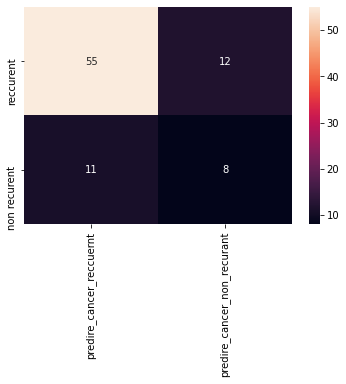

In [ ]:
#Visualisation de la matrice de confusion sur une Heatmap
confusion = pd.DataFrame(cm_svm, index=["reccurent", "non recurent"], columns=["predire_cancer_reccuernt", "predire_cancer_non_recurant"])
sns.heatmap(confusion, annot= True)

**Evaluation du modèle**

Estimons la précision avec laquelle le modèle peut prédire le cancer du sein des patients

In [ ]:
svm_result = accuracy_score(y_test,y_pred_svm)
print("Accuracy :",svm_result)

Accuracy : 0.7325581395348837


In [ ]:
recall_svm = cm_svm[0][0]/(cm_svm[0][0] + cm_svm[0][1])
precision_svm = cm_svm[0][0]/(cm_svm[0][0]+cm_svm[1][1])
print("Recall :",recall_svm,"Precision :",precision_svm)

Recall : 0.8208955223880597 Precision : 0.873015873015873


**2 - Classification des gènes avec le modèle Réseau de Neurones (ANN)**

In [ ]:
# Initialiser notre ANN
classifier = Sequential()

# Ajout de la première couche
classifier.add(Dense(units = 211, kernel_initializer="uniform", activation = 'relu', input_dim = 22283))

# Ajout de la couche caché
classifier.add(Dense(units = 211, kernel_initializer="uniform", activation = 'relu'))

# Ajout de la couche de sortie
classifier.add(Dense(units = 1, kernel_initializer="uniform", activation = 'sigmoid'))
                
# Compilation du modèle
classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [ ]:
classifier.fit(X_train, y_train, batch_size = 10, nb_epoch = 100)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: The `nb_epoch` argument in `fit` has been renamed `epochs`.
  """Entry point for launching an IPython kernel.


Epoch 1/100
200/200 [==============================] - 1s 7ms/step - loss: 1026.2063 - accuracy: 0.6250
Epoch 2/100
200/200 [==============================] - 1s 6ms/step - loss: 96.6656 - accuracy: 0.6750
Epoch 3/100
200/200 [==============================] - 1s 6ms/step - loss: 71.3462 - accuracy: 0.7100
Epoch 4/100
200/200 [==============================] - 1s 6ms/step - loss: 16.5857 - accuracy: 0.8000
Epoch 5/100
200/200 [==============================] - 1s 6ms/step - loss: 30.7840 - accuracy: 0.7850
Epoch 6/100
200/200 [==============================] - 1s 6ms/step - loss: 21.0534 - accuracy: 0.7850
Epoch 7/100
200/200 [==============================] - 1s 6ms/step - loss: 16.5889 - accuracy: 0.8300
Epoch 8/100
200/200 [==============================] - 1s 6ms/step - loss: 10.1883 - accuracy: 0.8050
Epoch 9/100
200/200 [==============================] - 1s 6ms/step - loss: 6.1674 - accuracy: 0.8450
Epoch 10/100
200/200 [==============================] - 1s 6ms/step - loss: 2.117

In [ ]:
y_pred = classifier.predict(X_test)
y_pred = (y_pred > 0.5)
# Matrice de confusion
cm_annk = confusion_matrix(y_test, y_pred)

In [ ]:
annk_result  = accuracy_score(y_test,y_pred)
print("Accuracy :",annk_result)

Accuracy : 0.7325581395348837


In [ ]:
recall_annk = cm_annk[0][0]/(cm_annk[0][0] + cm_annk[0][1])
precision_annk = cm_annk[0][0]/(cm_annk[0][0]+cm_annk[1][1])
print("Recall ANN :",recall_annk,"Precision ANN :",precision_annk)

Recall ANN : 0.7910447761194029 Precision ANN : 0.8412698412698413


In [ ]:
results = {'Accuracy': [svm_result*100,annk_result*100],
          'Recall': [recall_svm*100,recall_annk*100],
          'Precision': [precision_svm*100,precision_annk*100]}
index = ['SVM','ANN']

In [ ]:
results = pd.DataFrame(results,index=index)

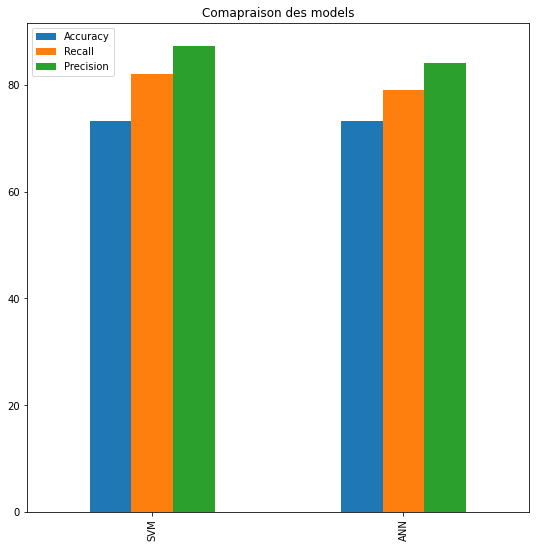

In [ ]:
fig =results.plot(kind='bar',title='Comapraison des models',figsize =(9,9)).get_figure()
fig.savefig('Final Result.png')